# Рынок заведений общественного питания Москвы

**Описание проекта**  

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.  

**Цель проекта**  

Подготовить исследование рынка общественного питания Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут инвесторам в выборе подходящего места для открытия нового заведения.

# Содержание  <a id="content"></a>

1. [Описание данных](#data_description)  
2. [Шаг 1. Загрузить данные и изучить общую информацию](#data_information)  
3. [Шаг 2. Выполнить предобработку данных](#preprocessing)  
4. [Шаг 3. Анализ данных:](#data_analysis)
  - [Категории заведений](#categories)  
  - [Количество посадочных мест в заведениях по категориям](#seats)  
  - [Соотношение сетевых и несетевых заведений](#chain)  
  - [Какие категории чаще сетевые](#often_chain)  
  - [Топ-15 популярных сетей в Москве](#top_chain)  
  - [Административные округа Москвы](#districts)  
  - [Распределение средних рейтингов по категориям заведений](#average_ratings)  
  - [Фоновая картограмма со средним рейтингом заведений каждого округа](#choropleth_rating)  
  - [Все заведения из датасета на карте](#all_places)  
  - [Топ-15 улиц по количеству заведений](#top_street)  
  - [Улицы с одним объектом общепита](#one_place)  
  - [Фоновая картограмма с ценовым индикатором округа Москвы](#choropleth_price)  
  - [Иные взаимосвязи](#other)  
  -- [Режим работы заведений](#open_hours)  
  -- [Заведения с 'плохим' рейтингом](#bad_rating)
  - [Общий вывод](#general_conclusion)  
5. [Шаг 4. Детализируем исследование: открытие кофейни](#open_cafe)  
  - [Количество кофеен, информация о районе расположения](#count_cafe)
  - [Топ-10 улиц по количеству кофеен](#top_coffee)
  - [Время работы кофеен.  Соотношение сетевых и несетевых заведений](#opening_hours)
  - [Распределение рейтингов кофеен по округам Москвы](#district_rating)
  - [Стоимость чашки капучино](#cappuccino_price)
  - [Рекомендации для открытия нового заведения](#recommendations)
  
6. [Ссылка на презентацию](#presentation)  

**Описание данных**  
<a id="data_description"></a> 

Файл `moscow_places.csv`:  

- `name` — название заведения;  
- `address` — адрес заведения;  
- `category` — категория заведения, например «кафе», «пиццерия» или «кофейня»;  
- `hours` — информация о днях и часах работы;  
- `lat` — широта географической точки, в которой находится заведение;  
- `lng` — долгота географической точки, в которой находится заведение;  
- `rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- `price` — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;  
- `avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
 - «Средний счёт: 1000–1500 ₽»;  
 - «Цена чашки капучино: 130–220 ₽»;  
 - «Цена бокала пива: 400–600 ₽». и так далее;  
- `middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:  
 - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.  
 - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.  
 - Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.  
- `middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:  
 - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.  
 - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.  
 - Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.  
- `chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):  
 - 0 — заведение не является сетевым  
 - 1 — заведение является сетевым  
- `district` — административный округ, в котором находится заведение, например Центральный административный округ;  
- `seats` — количество посадочных мест.

In [1]:
# импортируем необходимые библиотеки
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
from plotly import graph_objects as go
import json

# импортируем карту, маркер и хороплет 
from folium import Map, Marker, Choropleth

# импортируем кластер
from folium.plugins import MarkerCluster

# устанавливаем отображение
pd.set_option('display.max_columns', None)
#pd.set_option('display.float_format', '{:.2f}'.format)

#import warnings
#warnings.filterwarnings("ignore")

## Шаг 1. Загрузить данные и изучить общую информацию  
[Содержание](#content)  

<a id="data_information"></a> 

In [2]:
path = '/datasets/moscow_places.csv'
data = pd.read_csv(path)

In [3]:
# функция для вывода необходимых характеристик датафрейма
def data_info(data):
    display(data.head(8))
    print('___________________________')
    print('')
    
    print('Информация о датафрейме')
    print(data.info())
    print('___________________________')
    print('')
    
    print('Описание числовых столбцов')
    display(data.describe())
    print('___________________________')
    print('')
    
    print('Количество пропусков в столбцах')
    print(data.isna().sum().sort_values())
    print('___________________________')
    print('')
    
    print('Количество явных дубликатов')
    print(data.duplicated().sum())
    print('___________________________')

In [4]:
data_info(data)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0


___________________________

Информация о датафрейме
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB
None
___

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,8406.000000,8406.000000,8406.000000,3149.000000,535.000000,8406.000000,4795.000000
mean,55.750109,37.608570,4.229895,958.053668,174.721495,0.381275,108.421689
std,0.069658,0.098597,0.470348,1009.732845,88.951103,0.485729,122.833396
min,55.573942,37.355651,1.000000,0.000000,60.000000,0.000000,0.000000
25%,55.705155,37.538583,4.100000,375.000000,124.500000,0.000000,40.000000
50%,55.753425,37.605246,4.300000,750.000000,169.000000,0.000000,75.000000
75%,55.795041,37.664792,4.400000,1250.000000,225.000000,1.000000,140.000000
max,55.928943,37.874466,5.000000,35000.000000,1568.000000,1.000000,1288.000000


___________________________

Количество пропусков в столбцах
name                    0
category                0
address                 0
district                0
lat                     0
lng                     0
rating                  0
chain                   0
hours                 536
seats                3611
avg_bill             4590
price                5091
middle_avg_bill      5257
middle_coffee_cup    7871
dtype: int64
___________________________

Количество явных дубликатов
0
___________________________


In [5]:
# посмотрим на количество уникальных заведений в датасете и уникальные значения в столбцах
print('Количество уникальных заведений общепита - ', data['name'].nunique())

Количество уникальных заведений общепита -  5614


In [6]:
data['category'].value_counts()

кафе               2378
ресторан           2043
кофейня            1413
бар,паб             765
пиццерия            633
быстрое питание     603
столовая            315
булочная            256
Name: category, dtype: int64

In [7]:
data['district'].value_counts()

Центральный административный округ         2242
Северный административный округ             900
Южный административный округ                892
Северо-Восточный административный округ     891
Западный административный округ             851
Восточный административный округ            798
Юго-Восточный административный округ        714
Юго-Западный административный округ         709
Северо-Западный административный округ      409
Name: district, dtype: int64

In [8]:
data['hours'].value_counts()

ежедневно, 10:00–22:00                                  759
ежедневно, круглосуточно                                730
ежедневно, 11:00–23:00                                  396
ежедневно, 10:00–23:00                                  310
ежедневно, 12:00–00:00                                  254
                                                       ... 
пн-пт 08:00–17:00; сб,вс 09:00–21:00                      1
пн-чт 10:00–03:00; пт,сб 10:00–06:00; вс 10:00–03:00      1
пн-сб 08:30–18:30                                         1
пн-пт 09:00–20:00; сб,вс 08:00–20:00                      1
ежедневно, 06:30–11:00                                    1
Name: hours, Length: 1307, dtype: int64

In [9]:
data['price'].value_counts()

средние          2117
выше среднего     564
высокие           478
низкие            156
Name: price, dtype: int64

In [10]:
data['chain'].value_counts()

0    5201
1    3205
Name: chain, dtype: int64

**Вывод**  

Всего в нашем датасете 8406 заведений общественного питания Москвы и 5614 их них - уникальные.  
Типы данных во всех столбцах корректные, не требующие замены.  
Бросаются в глаза максимальные значения в столбцах среднего чека (35000 рублей), цены одной чашки кофе (1568 рублей) и количество посадочных мест (1288).  
Видим большое количество пропусков в столбцах `hours`, `seats`, `avg_bill`, `price`, `middle_avg_bill` и `middle_coffee_cup` .  
Явные дубликаты отсутствуют.  
Согласно выведенным данным можно сказать :  
- что самое распространенная категория заведений - это **`кафе`**, следующая категория по количеству - **`ресторан`**.  
- Больше всего заведений общепита сосредоточено в **`Центральном административном округе`**.  
- Самое большое количество заведений с режимом работы - **`ежедневно, 10:00–22:00`**, следующим, с небольшим отрывом, идет график - **`ежедневно, круглосуточно`**.  
- Лидирующая категория цен - **`средние`**.  
- Количество несетевых заведений в датафрейме больше, чем сетевых.  

## Шаг 2. Предобработка данных  
[Содержание](#content)  <a id="preprocessing"></a>

Явные дубликаты отсутствуют, но пропробуем выявить неявные дубликаты в столбцах `name` и `address`.

In [11]:
for column in ['name', 'address']:
    print('Для столбца:', column)
    print('Количество значений ДО попыток преобразовать столбец:', data[column].value_counts().count())
    
    data[column] = data[column].str.lower().str.strip()
    
    print('Количество значений ПОСЛЕ попыток преобразовать столбец:', data[column].value_counts().count())
    print()

Для столбца: name
Количество значений ДО попыток преобразовать столбец: 5614
Количество значений ПОСЛЕ попыток преобразовать столбец: 5512

Для столбца: address
Количество значений ДО попыток преобразовать столбец: 5753
Количество значений ПОСЛЕ попыток преобразовать столбец: 5752



In [12]:
#проверим наличие неявных дубликатов
data[['name', 'address']].duplicated().sum()

4

In [13]:
#удалим неявные дубликаты
data = data.drop_duplicates(subset=['name', 'address'])

Рассмотрим аномальные значения в столбцах `middle_avg_bill`, `middle_coffee_cup` и `seats`.

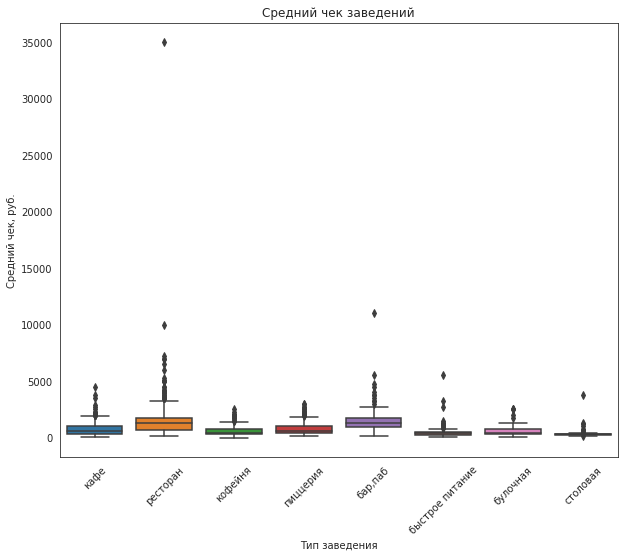

In [15]:
# столбец с оценкой среднего чека
sns.set_style('white')
plt.figure(figsize=(10,8))
sns.boxplot(y='middle_avg_bill', x='category', data=data)
plt.title('Средний чек заведений')
plt.xlabel('Тип заведения')
plt.ylabel('Средний чек, руб.')
plt.xticks(rotation=45)
plt.show()

In [16]:
data.query('middle_avg_bill >= 10000')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
730,чойхона,"бар,паб","москва, дмитровское шоссе, 95а",Северный административный округ,"ежедневно, 10:00–23:00",55.871497,37.543555,4.4,высокие,Средний счёт:5000–17000 ₽,11000.0,NaN,0,49.0
5481,гости,ресторан,"москва, шоссе энтузиастов, 52",Восточный административный округ,"пн,вс 18:00–22:30",55.759088,37.760570,4.1,высокие,Средний счёт:5000–15000 ₽,10000.0,NaN,0,NaN
7177,кафе,ресторан,"москва, каширское шоссе, 23, стр. 2",Южный административный округ,"ежедневно, круглосуточно",55.657450,37.646665,4.1,высокие,Средний счёт:20000–50000 ₽,35000.0,NaN,0,100.0


В данном столбце мы видим выбросы, и у трех заведений, явно выделяющиеся значения (средний чек более 10000 руб). Согласно отрытому источнику (https://yandex.ru/maps/213/moscow/?ll=37.617700%2C55.755863&z=10) в карточках заведений действительно указан данный диапазон цен, но согласно отзывам гостей, цены в ресторанах не такие кусачие. Можно предположить, что ошибки были допущены владельцами заведений в момент заполнения информации о месте на карте. В данном случае, удалим эти три строчки из нашего датафрейма.

In [17]:
data.drop(index=data.query('middle_avg_bill > 10000').index, inplace=True)

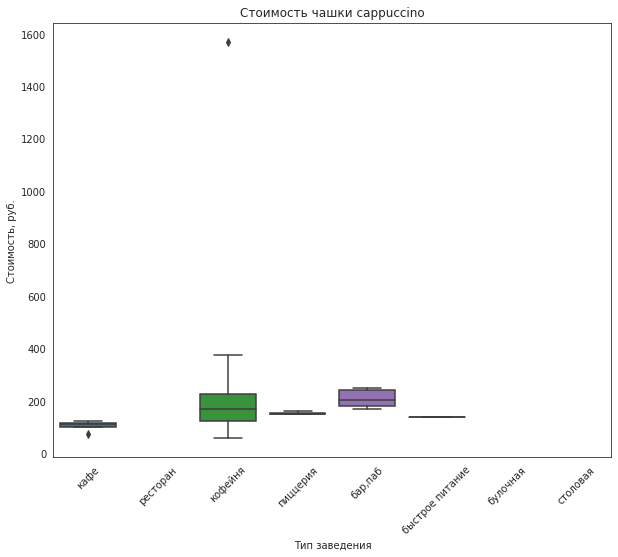

In [18]:
# столбец с оценкой одной чашки капучино

plt.figure(figsize=(10,8))
sns.boxplot(y='middle_coffee_cup', x='category', data=data)
plt.title('Стоимость чашки cappuccino')
plt.xlabel('Тип заведения')
plt.ylabel('Стоимость, руб.')
plt.xticks(rotation=45)
plt.show()

In [19]:
data.query('middle_coffee_cup >= 1000')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
2859,шоколадница,кофейня,"москва, большая семёновская улица, 27, корп. 1",Восточный административный округ,"ежедневно, 08:00–23:00",55.782268,37.709022,4.2,средние,Цена чашки капучино:230–2907 ₽,NaN,1568.0,1,48.0


Согласно Яндекс.картам цена чашки капучино в данном заведении действительно указана в диапазоне 230–2907 ₽, а средний счет 700–800 ₽, из этого можно предположить, что 2907 - это опечатка и подразумевалось 290 рублей. Исправим неточность в столбцах avg_bill и middle_coffee_cup, и добавим значение в столбец middle_avg_bill.

In [20]:
data.loc[2859, 'avg_bill'] = 'Цена чашки капучино:230–290 ₽'
data.loc[(data['lat'] == 55.782268) & (data['middle_avg_bill'].isna()), 'middle_avg_bill'] = 750
data.loc[2859, 'middle_coffee_cup'] = 260

In [21]:
# data.loc[[2859]]

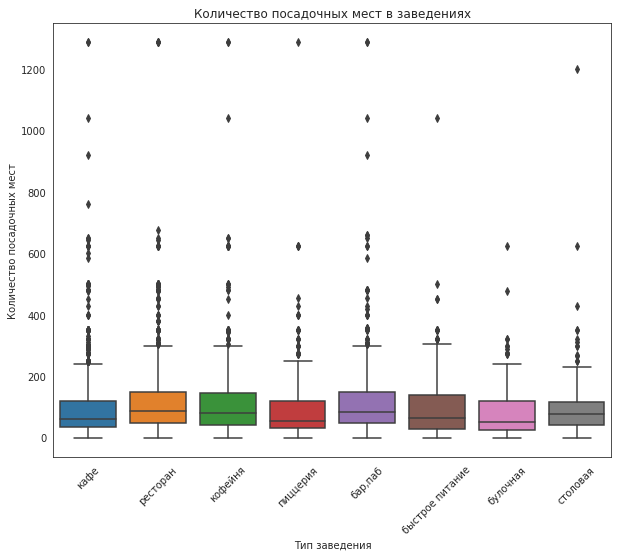

In [22]:
# столбец с количеством посадочных мест

plt.figure(figsize=(10,8))
sns.boxplot(y='seats', x='category', data=data)
plt.title('Количество посадочных мест в заведениях')
plt.xlabel('Тип заведения')
plt.ylabel('Количество посадочных мест')
plt.xticks(rotation=45)
plt.show()

In [23]:
data.query('seats >= 600')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1326,нам,"бар,паб","москва, ленинградский проспект, 69, стр. 1",Северный административный округ,"ежедневно, 11:00–21:00",55.803236,37.517898,4.2,NaN,NaN,NaN,NaN,1,625.0
1351,максима пицца,пиццерия,"москва, ленинградский проспект, 78, корп. 1",Северный административный округ,"пн-пт 09:00–00:00; сб,вс 10:00–00:00",55.805807,37.513994,4.3,выше среднего,Средний счёт:1500–1800 ₽,1650.0,NaN,0,625.0
1355,страдивари,ресторан,"москва, ленинградский проспект, 77, корп. 1",Северный административный округ,"ежедневно, 11:00–23:00",55.804980,37.509454,4.2,выше среднего,Средний счёт:1000–2000 ₽,1500.0,NaN,1,625.0
1367,академия,пиццерия,"москва, ленинградский проспект, 72, корп. 1",Северный административный округ,"пн-пт 09:00–23:00; сб,вс 11:00–23:00",55.805579,37.520086,4.2,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,1,625.0
1380,север-метрополь,кофейня,"москва, ленинградский проспект, 75, корп. 1",Северный административный округ,"ежедневно, 09:00–21:00",55.804940,37.512423,4.6,NaN,NaN,NaN,NaN,1,625.0
1385,чайхона на соколе,кафе,"москва, ленинградский проспект, 69, стр. 1",Северный административный округ,"ежедневно, 08:00–23:00",55.803236,37.517931,4.3,средние,Средний счёт:400–800 ₽,600.0,NaN,0,625.0
1393,кулинарная лавка братьев караваевых,кафе,"москва, ленинградский проспект, 72, корп. 1",Северный административный округ,"ежедневно, 08:00–23:00",55.805791,37.520339,4.3,NaN,Средний счёт:500–800 ₽,650.0,NaN,1,625.0
1442,abc coffee roasters,кофейня,"москва, ленинградский проспект, 72, корп. 1",Северный административный округ,"пн-пт 08:00–22:00; сб,вс 10:00–22:00",55.805547,37.520395,4.5,средние,Цена чашки капучино:220–270 ₽,NaN,245.0,0,625.0
1446,9 bar coffee,кофейня,"москва, ленинградский проспект, 80, корп. 1",Северный административный округ,"пн-пт 07:30–21:00; сб,вс 07:30–19:00",55.810352,37.506625,4.3,NaN,Цена чашки капучино:60–150 ₽,NaN,105.0,1,625.0
1464,находка,ресторан,"москва, ленинградский проспект, 74, корп. 1",Северный административный округ,"ежедневно, 09:00–22:00",55.804972,37.517319,4.9,NaN,NaN,NaN,NaN,1,625.0


In [24]:
# round(len(data.query('seats >= 600')) / data.shape[0] *100, 2)

В данном случае наблюдается интересная особенность, разные заведения расположены по одному адресу и количество посадочных мест в них указано одинаковое. Можно предположить что это, либо ошибка при заполнении карточки организации, либо у представленных заведений один собственник и указывали количество посадочных мест суммарно или приблизительно, так как, согласно фотографиям этих помещений на Яндекс.картах, количество посадочных мест в них значительно меньше указанных в нашей таблице.  
Корректно исправить данную неточность нет возможности, удалим строки с выбивающимися значениями (количество таких строк составляет около 0,6% от всего датафрейма).  
Также стоить отметить, что в столбце с количеством посадочных мест, в принципе есть аномальные значения - для небольшой пекарни 100 мест или в кофейне 300 мест и т.д. Выявить точные данные в данном случае нет возможности.

In [25]:
data.drop(index=data.query('seats >= 600').index, inplace=True)

В нашем датафрейме есть большое количество пропусков в столбцах.  
Информация о днях и часах работы ( `hours` ) , количестве посадочных мест ( `seats` ) и о средней стоимости заказа ( `avg_bill` ) составлялась на основе данных сервисов Яндекс, где, в свою очередь, собственники заведений могли не указать данную информацию, либо же, данные были утеряны в момент загрузки/выгрузки информации.  
Столбцы `middle_avg_bill` и `middle_coffee_cup` не могут быть заполнены из-за отсутствия информации с столбце со средней стоимостью заказа.  
Можно было бы выявить категорию цен в заведении ( `price` ) по средней стоимости заказа, но ценовой разброс слишком неравномерный, так для категории "средние" средний счет может составлять как 150-350 рублей, так и 1500-2000 рублей .  
Использовать для столбцов средние или мидианные значения было бы нецелесообразно, это может сильно исказить наши данные для дальнейшего исследования, ведь информация о заведениях может сильно отличаться в зависимости от различных факторов: район расположения, является сетевым или нет, категория заведения и т.д.   Оставим пропуски без изменений.

In [26]:
# создадим столбец street с названиями улиц
data['street'] = data['address'].str.split(', ').str[1]

In [27]:
# создадим столбец is_24_7 (заведение работает ежедневно и круглосуточно)
# заменим пропуски в столбце на False
data['is_24_7'] = data['hours'].str.contains('ежедневно, круглосуточно')
data['is_24_7'] = data['is_24_7'].fillna(False)

**Вывод**  

Явные дубликаты в исходных данных отсутствуют, удалили неявные дубликаты в столбцах `name` и `address` .  
Удалили/подкорректировали строки с выбивющимися значениями в столбцах `middle_avg_bill`, `middle_coffee_cup` и `seats` .  
Пропуски в столбцах оставили без изменений, чтобы избежать искажения данных в дальнейшем исследовании.  
Добавили столбец с названием улиц и столбец с обозначением, работает ли заведение ежедневно и круглосуточно или нет.

## Шаг 3. Анализ данных:  
[Содержание](#content)  <a id="data_analysis"></a>

### Категории заведений   
<a id="categories"></a>  

Рассмотрим какие категории заведений представленны в данных, какое количество объектов общественного питания разбито по категориям.

In [28]:
data_category = (data
    .pivot_table(index='category', values='name', aggfunc='count')
    .rename(columns={'name': 'count'})
    .sort_values(by='count', ascending=False)
    .reset_index()
)
data_category

,category,count
0,кафе,2363
1,ресторан,2029
2,кофейня,1401
3,"бар,паб",754
4,пиццерия,629
5,быстрое питание,602
6,столовая,313
7,булочная,255


In [29]:
fig = px.bar(data_category, 
             x='category', 
             y='count',
             text='count')
fig.update_layout(title_text='Распределение заведений по категориям', 
                  xaxis_title='Категория заведений', 
                  yaxis_title='Количество',
                 plot_bgcolor='rgba(0,0,0,0)',
                 )
fig.update_traces(marker_color='#483D8B')
fig.show()

![](1.jpg)

In [30]:
#fig=go.Figure(data=[go.Pie(labels=data_category['category'], values=data_category['count'], pull=[0.05])])
#fig.update_traces(marker=dict(colors=['#483d8b', '#685a9e', '#8679b1', '#a499c4', '#b28ac5', '#c9a0dc', '#d2b0e2', '#e5cfee'], line=dict(color='#ffffff', width=2)))
#fig.update_layout(title_text='Доли заведений от общего количества')
#fig.show()

**Вывод**  
Согласно графикам, в данных представленно 8 категорий заведений.  
Самое большое количество заведений общественного питания представлено в категориях кафе (2363 заведений), ресторан (2029 заведений) и на третьем месте кофейня (1401 заведений).  Меньше всего заведений с категориях столовая и булочная (313 и 255 соответственно).  
Суммарно эти три лидирующие категории составляют почти 70% рынка общественного питания Москвы;  бар,паб и пиццерия составляют почти 17% от общего числа заведений и оставшееся количество приходится на долю заведений быстрого питания, столовых и булочных.

### Количество посадочных мест в заведениях по категориям  
[Содержание](#content)  <a id="seats"></a>  

Рассмотрим количество посадочных мест в заведениях по категориям 

In [31]:
data_seats = (data
    .pivot_table(index='category', values='seats', aggfunc={'count', 'median', 'mean'})
    .round(0)
    .rename(columns={'seats': 'count'})
    .sort_values(by='count', ascending=False)
    .reset_index()
)
data_seats

,category,count,mean,median
0,ресторан,1256,115.0,86.0
1,кафе,1204,90.0,60.0
2,кофейня,739,100.0,78.0
3,"бар,паб",457,110.0,80.0
4,пиццерия,423,88.0,52.0
5,быстрое питание,348,96.0,65.0
6,столовая,162,90.0,75.0
7,булочная,147,86.0,50.0


In [32]:
fig = px.bar(data_seats, 
             x='category', 
             y='count',
             text='count')
fig.update_layout(title_text='Количество посадочных мест в заведениях по категориям', 
                  xaxis_title='Категория заведений', 
                  yaxis_title='Количество мест',
                 plot_bgcolor='rgba(0,0,0,0)',
                 )
fig.update_traces(marker_color='#483D8B')
fig.show()

![](2.jpg)

In [33]:
fig = px.bar(data_seats.sort_values(by='median', ascending=False),
             x='category', 
             y='median',
             text='median')
fig.update_layout(title_text='Медианное количество посадочных мест в заведениях по категориям', 
                  xaxis_title='Категория заведений', 
                  yaxis_title='Медианное количество мест',
                 plot_bgcolor='rgba(0,0,0,0)',
                 )
fig.update_traces(marker_color='#483D8B')
fig.show()

![](3.jpg)

По таблице мы видим, средние и медианные значения количества посадочных мест в заведениях сильно различаются. Это говорит о том, что данные в нашем датафрейме необнородны. К тому же, среднее значение сильно подвержено выбросам, в то время, как медианное это все сглаживает.  
По количеству посадочных мест лидируют рестораны и кафе (1256 и 1204 мест соответственно). Третье место так же занимают кофейни (739 мест) и меньше всего посадочных мест у столовых и булочных (162 и 147 соответственно).  
Медианное количество посадочных мест разпределено немного иначе. Так можно сказать что среди категории ресторан, в одном заведении 86 посадочных мест. Сделом идут бар/паб и кофейня (80 и 78 мест на одно заведение соответственно) и меньше всего мест на одно заведение у категорий пиццерия и булочная (52 и 50 мест соответственно).  

Рассмотрим распределение количества посадочных мест в зависимости от параметров: `округ`, `ценовая категория` и `сетевое заведение`.

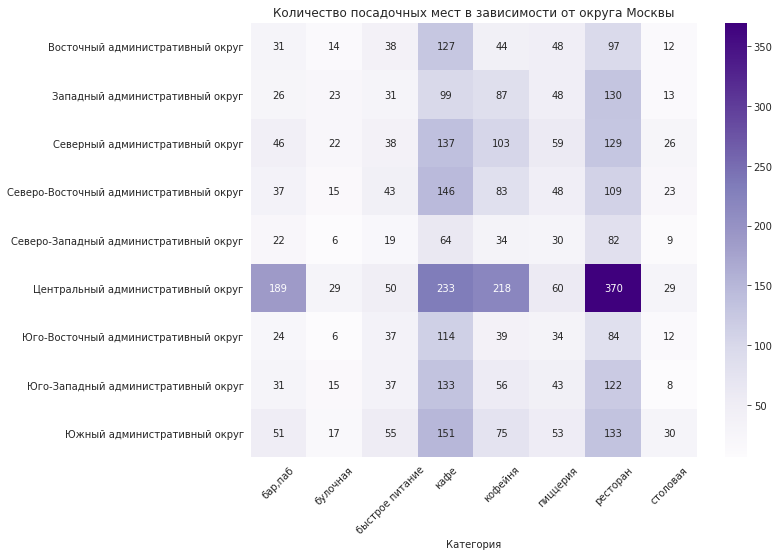

In [34]:
plt.figure(figsize=(10,8))
sns.heatmap(data
            .pivot_table(index='district', columns = 'category', values='seats', aggfunc='count'), 
            annot = True, 
            fmt='.0f', 
            cmap='Purples')
plt.xticks(rotation=45)
plt.title('Количество посадочных мест в зависимости от округа Москвы')
plt.xlabel('Категория')
plt.ylabel('')
plt.show()

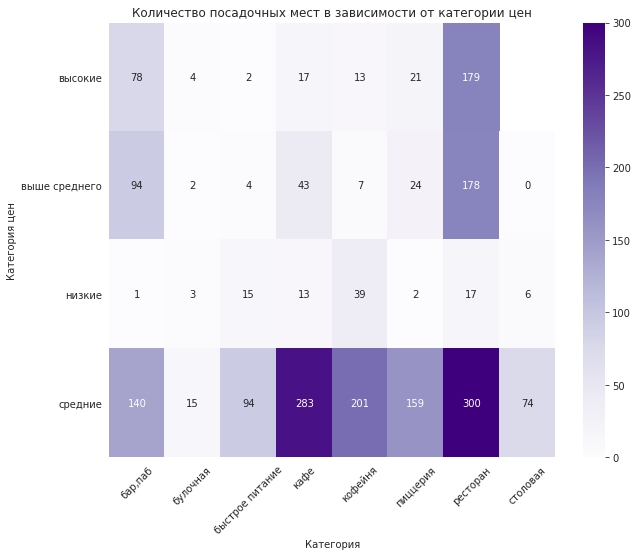

In [35]:
plt.figure(figsize=(10,8))
sns.heatmap(data
            .pivot_table(index='price', columns = 'category', values='seats', aggfunc='count'), 
            annot = True, 
            fmt='.0f', 
            cmap='Purples')
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.title('Количество посадочных мест в зависимости от категории цен')
plt.xlabel('Категория')
plt.ylabel('Категория цен')
plt.show()

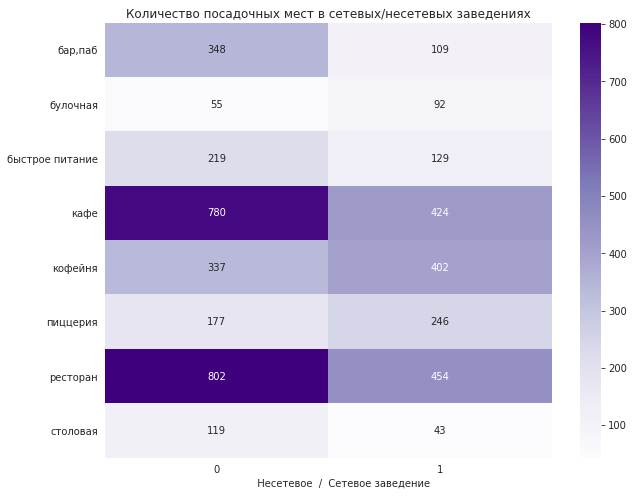

In [36]:
plt.figure(figsize=(10,8))
sns.heatmap(data
            .pivot_table(index='category', columns = 'chain', values='seats', aggfunc='count'), 
            annot = True, 
            fmt='.0f', 
            cmap='Purples')
plt.yticks(rotation=0)
plt.title('Количество посадочных мест в сетевых/несетевых заведениях')
plt.xlabel('          Несетевое  /  Cетевое заведение')
plt.ylabel('')
plt.show()

Все три графика также подтверждают, что в тройке лидеров по количеству посадочных мест `рестораны`, `кафе` и `кофейни` .  
По району расположения лидирует `Центральный административный округ`.  Следом можно выделить `Южный` и `Северный` административные округа.  
В заведениях со `средней` ценовой политикой представленно больше всего посадочных мест, причем по каждой категории заведений. Среди категорий цен `выше среднего` и `высокие` больше всего посадочных мест у ресторанов и бар/пабов.  
В `несетевых` заведениях общепита рестораны и кофейни также занимают лидирующие позиции по количеству сидячих мест. Среди `сетевых` заведений можно выделить пиццерии, кофейни и булочные, в них количество сидячих мест больше, чем в несетевых заведениях этой же категории. 

**Вывод**  

Больше всего посадочных мест представлено:  
- в ресторанах - 1256 мест    
- в кафе - 1204 мест     
- в кофейнях - 739 мест  
Подобное распределение, вероятно, обусловлено популярностью данных категорий общественного питания у жителей и гостей столицы. В ресторанах, помимо того, чтобы отдохнуть или насладиться авторскими блюдами, часто проводят различные мероприятия (корпоративы, дни рождения, свадьбы), кафе и кофейни - отличное место, чтобы встретиться с друзьями или пообедать.  


Меньше всего посадочных мест: в столовых и булочных (162 и 147 мест соответственно).  Это может быть обусловлено самой спецификой данных заведений. Они не предназначены для долгих застольев или встреч с друзьями, самое оптимальное - это пообедать или перекусить по дороге по делам, или же купить вкусную и свежую выпечку.  

Среди округов Москвы, по количеству посадочных мест лидирует Центральный административный округ. Помимо того, что это центральное и популярное место столицы, вероятно там сосредоточено и самое большое количество заведений общественного питания (данную гипотезу мы проверим в последующем анализе).  

Среди категорий цен, заведения со "средней" ценовой политикой лидируют по количеству посадочных мест в каждой категории заведений. Помимо того, что не все себе могут позволить посещать дорогие места, скорее всего, заведений со "средними" ценами в нашем датафрейме представлено больше (данную гипотезу мы также проверим чуть позже).  

Среди несетевых заведений, самое большое количество посадочных мест у ресторанов и кафе. Интересную особенность среди сетевых заведений показывают категории булочная, кофейня и пиццерия, в данном случае, количество посадных мест в этих заведениях больше, чем у несетевых. Это может быть связано как с политикой заведения, так и с успешностью сети, если сеть популярная и прибыльная, открывают дополнительные залы или новые точки сети, увеличивая тем самым количество мест для посетителей.

### Соотношение сетевых и несетевых заведений  
[Содержание](#content)  <a id="chain"></a>  

Рассмотрим соотношение сетевых и несетевых заведений в датасете.

In [37]:
data.groupby('chain')['name'].count()

chain
0    5169
1    3177
Name: name, dtype: int64

In [38]:
fig = go.Figure(data=[go.Pie(labels=['несетевые', 'сетевые'], 
                             values=data['chain'].value_counts(),
                             pull=[0.05])])
fig.update_traces(marker=dict(colors=['#483d8b', '#a499c4'], line=dict(color='#ffffff', width=2)))
fig.update_layout(title_text='Распределение сетевых и несетевых заведений')
fig.show()

![](4.jpg)

Круговая диаграмма наглядно иллюстрирует, что количество несетевых заведений общественного питания (5169 заведение или 61,9% от общего числа) значительно преобладает над количеством сетевых заведений (3177 заведений или 38,1%).

### Какие категории чаще сетевые
[Содержание](#content)  <a id="often_chain"></a>  

In [42]:
data_chain_2 = (
    data
    .pivot_table(index='category', columns='chain', values='name', aggfunc="count")
    .rename(columns={0: "not_chain", 1: "is_chain"})
    .reset_index()
)
data_chain_2['total'] = data_chain_2['not_chain'] + data_chain_2['is_chain']
data_chain_2['chain_share'] = round(data_chain_2['is_chain']/data_chain_2['total']*100)
data_chain_2 = data_chain_2.sort_values(by='chain_share', ascending=False)
data_chain_2

chain,category,not_chain,is_chain,total,chain_share
1,булочная,99,156,255,61.0
5,пиццерия,301,328,629,52.0
4,кофейня,688,713,1401,51.0
2,быстрое питание,371,231,602,38.0
6,ресторан,1308,721,2029,36.0
3,кафе,1589,774,2363,33.0
7,столовая,226,87,313,28.0
0,"бар,паб",587,167,754,22.0


In [43]:
fig = px.bar(data_chain_2, 
             x='category', 
             y='chain_share',
             text='chain_share')
fig.update_layout(title_text='Распределение доли сетевых заведений (в процентах) в рамках одной категории', 
                  xaxis_title='Категория заведений', 
                  yaxis_title='Доля заведений, %',
                 plot_bgcolor='rgba(0,0,0,0)',
                 )
fig.update_traces(marker_color='#483D8B')
fig.show()

![](5.jpg)

Больше всего сетевых предприятий, в абсолютном выражении, представлено среди категорий:
- кафе - 774 заведения 
- рестораны - 721 заведения 
- кофейни - 713 заведений  

Это можно объяснить как популярность данных категорий заведений, так и стремлением предпринимателей открывать новые рестораны, кафе и кофейни, развивая не только собственные проекты с нуля, но и по франшизе. Так среди кофеен в топ-10 вошли Шоколадница, Cofix, Кофе Хаус, Costa Coffee (https://ecomhub.ru/top-10-cafes-and-coffee-houses-by-attendance-in-moscow-and-the-region-in-2022-chronicles-of-post-february-russiamoskvi/). В категории кафе, такие известный сети как Якитория, Му-му, Братья Караваевы, Андерсон и другие. Рестораны, в свою очередь, знамениты такими игроками, как Тануки, Чайхона №1, Нияма, Тарас Бульба, Урюк (https://www.moscow-restaurants.ru/restaurants/chain.html).                                

Тем не менее, среди всех категорий, `чаще всего сетевыми являются`:
- `Булочные` - 61 %  (156 против 99)
- `Пиццерии` - 52 %  (328 против 301)
- `Кофейни` - 51 %  (713 сетевых против 688)
  

Данный формат заведений популярен среди жителей и гостей столицы, они дают отличную возможность перекусить по дороге по делам, насладиться свежем кофе, вкусной выпечкой или побаловать себя в любимой пиццерии. Помимо этого,  кофейная индустрия укрепляет свои позиции на московском рынке стрит-ретейла не только с помощью увеличения своей географии, переориентации рынка на популярный формат - coffee-to-go, но и за счет уменьшения арендуемых площадей (https://realty.rbc.ru/news/5d95b4739a79477c49e88ba7"). Подобное высказывание характерно и для категорий пиццерия и булочная. Также немаловажную роль играет возможность приобрести готовую бизнес-модель (франшизу). Открытие заведения по известной франшизе избавит предпринимателя от необходимости раскручивать собственный бренд, придумывать бизнес-стратегию, составлять меню. Обкатанная на десятках других заведений бизнес-модель позволит быстро окупить вложения и выйти на стабильную прибыль (https://www.kp.ru/money/biznes/luchshie-franshizy-pitstserij-v-rossii/). 

### Топ-15 популярных сетей в Москве
[Содержание](#content)  <a id="top_chain"></a>  

Найдем топ-15 популярных сетей Москвы. 

Под популярностью, мы будем подразумевать наибольшее количество заведений в рамках одной сети на рынке заведений общественного питания Москвы.

In [44]:
top_chain = data.query('chain == 1')
#top_chain.sample(5)

In [45]:
top_chain = (
    top_chain.groupby(['name', 'category'])
    .agg({'rating':'median', 'name':'count'})
    .rename(columns={'name': 'count'})
    .sort_values(by='count', ascending=False)
    .reset_index()
    .head(15)
    )
top_chain

,name,category,rating,count
0,шоколадница,кофейня,4.2,117
1,домино'с пицца,пиццерия,4.2,76
2,додо пицца,пиццерия,4.3,74
3,one price coffee,кофейня,4.2,70
4,яндекс лавка,ресторан,4.0,68
5,cofix,кофейня,4.1,65
6,prime,ресторан,4.2,49
7,кофепорт,кофейня,4.2,42
8,кулинарная лавка братьев караваевых,кафе,4.4,38
9,теремок,ресторан,4.1,36


In [46]:
#top_chain.groupby(['category'])['name'].count()

In [47]:
#round(top_chain['rating'].mean(), 1)

In [48]:
fig = px.bar(top_chain,
             x='count',
             y='name',
             text='count',
             )
fig.update_layout(title='Топ-15 популярных сетей Москвы',
                  xaxis_title='Количество точек сети',
                  yaxis_title='',
                  yaxis={'categoryorder':'total ascending'},
                  width=1050,
                  height=650,
                 plot_bgcolor='rgba(0,0,0,0)',
                 )
fig.update_traces(marker_color='#483D8B')
fig.show()

![](6.jpg)

- Лидером, по количеству заведений на рынке общественного питания Москвы среди сетей оказалась `Шоколадница` .  
- Также в топ-15 вошли такие популярные заведения, как Домино'с и Додо пицца, сеть кофеин фиксированной цены - Cofix, лавка братьев Короваевых, Теремок и другие.  .
- Замыкает топ-15, сеть кофеин - `Кофемания` .  
- Средний рейтинг у заведений из топ-15 - `4.2`.  Самый высокий рейтинг у пекарни Буханка, Кофемании и лавки братьев Короваевых - `4.4` . Рейтинг остальных заведений не опустился ниже 4.0, но и не пересек рубеж в 4.5 . Это может быть связано с большим количеством заведений сети, отзывов много и рейтинг усредняется, влияет и район расположения, и персонал в конкретном заведении и т.д.  
- Среди категорий заведений, в топ-15 вошло 6 кофеин, 3 кафе и ресторана, 2 пиццерии и 1 булочная. Успех последней (пекарня Буханка) обусловлен удачной бизнес-моделью, популярностью у покупателей и удобным расположением "пекарня у дома".

### Административные округа Москвы
[Содержание](#content)  <a id="districts"></a>  

Посмотрим, какие административные округа Москвы присутствуют в датасете и отобразим количество заведений каждой категории по округам.

In [49]:
data_dist = data.pivot_table(index='district', columns='category', values='name', aggfunc= 'count')
data_dist = data_dist.reset_index()
data_dist.columns = ['district', 'бар,паб', 'булочная', 'быстрое питание', 'кафе', 'кофейня', 'пиццерия', 'ресторан', 'столовая']
data_dist['total'] = data_dist.loc[:].sum(axis=1)
data_dist = data_dist.sort_values(by='total', ascending=False)
data_dist

,district,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,total
5,Центральный административный округ,364,50,87,464,428,113,670,66,2242
3,Северо-Восточный административный округ,62,28,82,269,159,68,182,40,890
8,Южный административный округ,68,25,85,264,131,73,200,44,890
2,Северный административный округ,65,38,58,230,186,74,183,40,874
1,Западный административный округ,46,37,62,233,146,70,213,23,830
0,Восточный административный округ,50,25,70,270,104,72,160,40,791
6,Юго-Восточный административный округ,38,13,67,282,89,55,145,25,714
7,Юго-Западный административный округ,38,27,61,236,96,64,167,17,706
4,Северо-Западный административный округ,23,12,30,115,62,40,109,18,409


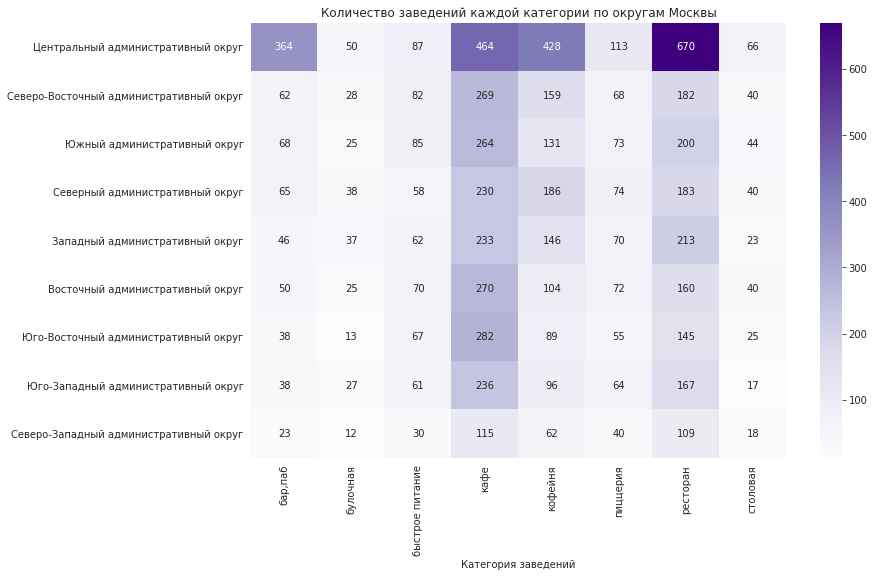

In [50]:
fig, ax = plt.subplots(figsize = (12,8))
sns.heatmap(data_dist[['бар,паб', 'булочная', 'быстрое питание', 'кафе', 'кофейня', 'пиццерия', 'ресторан', 'столовая']],
           yticklabels = data_dist['district'], annot=True, cmap='Purples', fmt='.0f')
ax.set(xlabel='Категория заведений')
ax.set_title('Количество заведений каждой категории по округам Москвы')
plt.show()

- Как мы предполагали в исследовании выше, в Центральном административном округе сосредоточено самое большое количество заведений общественного питания (2242 заведения). В Северо-Восточном, Южном и Северном административных округах расположено примерно одинаковое количество заведений (890, 890 и 874 соответственно). Далее количество предприятий по округам Москвы снижается и меньше всего заведений представлено в Северо-Западном административном округ (409 заведений).  
- Самое большое количество заведений в каждой из восьми категорий также сосредоточено в Центральном административном округе. Кафе, рестораны и кофейни занимают лидирующие места по количеству заведений в каждом округе Москвы. В Центральном округе бары и пабы лишь немного отстают по количеству заведений от лидеров, что свидетельствует о спросе на подобные заведения в центральной части столицы. Меньше всего представлено предприятий быстрого питания, столовых и булочных.

### Распределение средних рейтингов по категориям заведений
[Содержание](#content)  <a id="average_ratings"></a>  


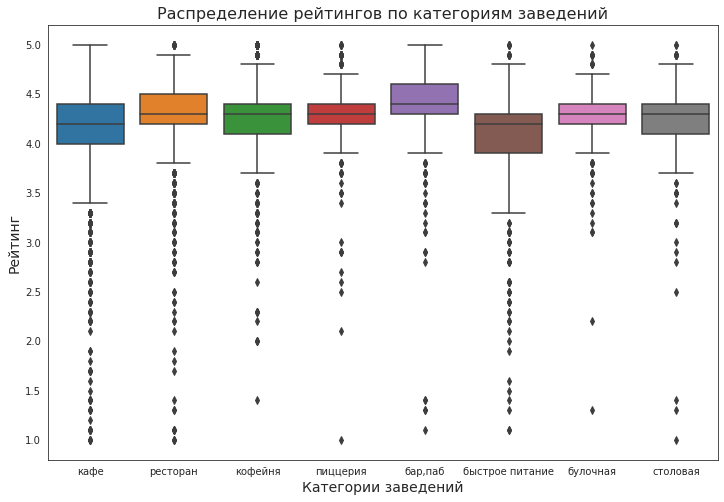

In [54]:
plt.figure(figsize=(12,8))
sns.set_style("white")
_ = sns.boxplot(x="category", y="rating", data=data)
_.axes.set_title('Распределение рейтингов по категориям заведений', fontsize=16)
_.set_xlabel('Категории заведений', fontsize=14)
_.set_ylabel('Рейтинг', fontsize=14)
plt.show()

Из графика выше мы можем сделать вывод, что:
- среди всех категорий заведений, медианное значение рейтингов находится приблизительно на обном уровне и не опускается ниже 4-х баллов
- самое высокое значение медианы у баров и пабов (в районе 4.5)
- у ресторанов, кофеен и пиццерий медиана находится на одном уровне (в районе 4.3)
- можно отметить, что среди кафе и предприятий быстрого питания наблюдается наибольший разброс рейтингов 
- посетители пиццерий и булочных склонны оценивать заведение одинаково высоко

### Фоновая картограмма со средним рейтингом заведений каждого округа Москвы
[Содержание](#content)  <a id="choropleth_rating"></a>  


In [55]:
data_rating = (
    data.groupby('district', as_index=False)['rating']
    .agg('mean')
    .round(2)
    .sort_values(by='rating', ascending=False)
)
data_rating

,district,rating
5,Центральный административный округ,4.38
2,Северный административный округ,4.24
4,Северо-Западный административный округ,4.21
1,Западный административный округ,4.18
8,Южный административный округ,4.18
0,Восточный административный округ,4.17
7,Юго-Западный административный округ,4.17
3,Северо-Восточный административный округ,4.15
6,Юго-Восточный административный округ,4.10


In [56]:
# читаем файл с JSON-форматом и сохраняем в переменной
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

#print(json.dumps(geo_json, indent=2, ensure_ascii=False, sort_keys=True))

In [57]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=data_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='PuBu',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по округам Москвы',
).add_to(m)

# выводим карту
m

![](7.jpg)

На карте Москвы мы видим, что самые высокие средние рейтинги заведений в Центральном административном округе, где и сосредоточено самое большое количество предприятий. Далее идут Северный и Северо-Западный административные округа. Самый низкий средний рейтинг заведений у Юго-Восточного административного округа. Стоит отметить, что средний рейтинг всех заведений, не опускается ниже отметки в 4 балла.

### Все заведения из датасета на карте
[Содержание](#content)  <a id="all_places"></a>  

Отобразим все заведения датасета на карте Москвы

In [58]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=data_dist,
    columns=['district', 'total'],
    key_on='feature.name',
    fill_color='PuBu',
    fill_opacity=0.8,
    legend_name='Количество заведений по округам Москвы',
).add_to(m)

# выводим карту
m

![](8.jpg)

Данная карта хорошо иллюстрирует, что большинство заведений сосредоточено в центральной части Москвы. 

### Топ-15 улиц по количеству заведений
[Содержание](#content)  <a id="top_street"></a>  


In [59]:
# сначала найдем топ-15 улиц по количеству заведений
top_street = (
    data.groupby('street')[['name']]
    .count()
    .rename(columns={'name': 'count'})
    .sort_values(by='count', ascending=False)
    .reset_index()
    .head(15)
)
top_street

,street,count
0,проспект мира,183
1,профсоюзная улица,122
2,ленинский проспект,107
3,проспект вернадского,97
4,дмитровское шоссе,87
5,каширское шоссе,76
6,варшавское шоссе,76
7,ленинградский проспект,72
8,ленинградское шоссе,70
9,мкад,65


In [60]:
fig = px.bar(top_street,
             x='count',
             y='street',
             text='count',
             )
fig.update_layout(title='Топ-15 улиц с самым большим количеством заведений',
                  xaxis_title='Количество заведений',
                  yaxis_title='',
                  yaxis={'categoryorder':'total ascending'},
                  width=900,
                  height=600,
                 plot_bgcolor='rgba(0,0,0,0)',
                 )
fig.update_traces(marker_color='#483D8B')
fig.show()

![](9.jpg)

In [61]:
# теперь отберем таблицу только с улицами из топ-15
top_street_15 = data.query('street in @top_street["street"]')
#top_street_15

In [62]:
# сгруппируем по улице и категории
top_street_15 = (top_street_15
                 .groupby(['street', 'category'])[['name']].count()
                 .reset_index()
                 .sort_values(by='name', ascending=False)
                )
#top_street_15

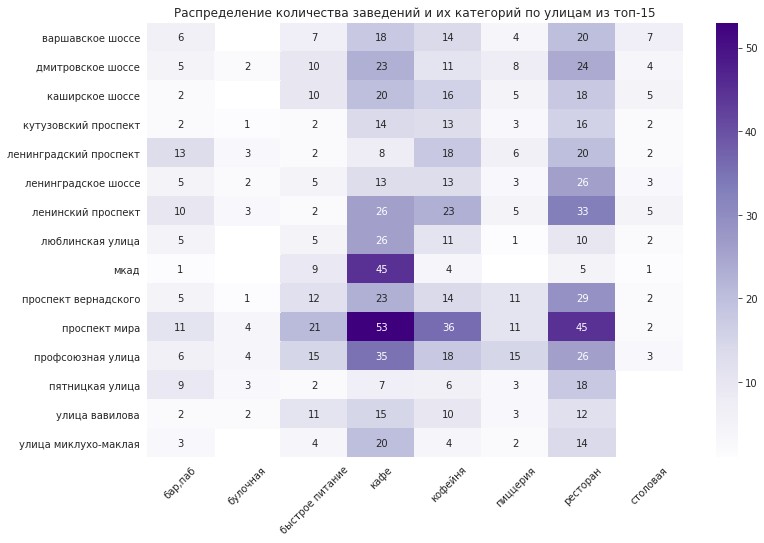

In [63]:
plt.figure(figsize=(12,8))
sns.heatmap(top_street_15.pivot('street', 'category', values='name'), 
            annot = True,
            cmap='Purples')
plt.yticks(rotation=0)
plt.title('Распределение количества заведений и их категорий по улицам из топ-15')
plt.xlabel('')
plt.ylabel('')
plt.xticks(rotation=45)
plt.show()

- С достаточно большим отрывом, лидером среди топ-15 улиц Москвы по количеству заведений оказался Проспект мира (183 предприятия). Лидирует эта улица и по количеству заведений в рамках одной категории, больше всего на ней расположено кафе, ресторанов и кофеин. Это можно объяснить как и большой протяженностью улицы, так и наличием культурно-значимых объектов, таких как Ботанический сад МГУ,  ВДНХ (который включен в список самых крупных экспонирующих, музейных и рекреационных центров мира), музей космонавтики и др. 
- Следом идут Профсоюзная улица и Ленинский проспект, на них расположено 122 и 107 заведения соответственно. Профсоюзная улица занимает первое место в топ-5 по протяженности улиц Москвы (https://dzen.ru/a/ZFeQIBZ7qlOoKymk). Больше всего на ней расположено кафе и ресторанов (35 и 26 соответственно).  Ленинский проспект расположен в непосредственной близосте к Нескучному саду и парку Культуры и отдыха, также на нем расположено много Торгово-развлекательных центров. Среди категорий ледируют рестораны, кафе и кофейни.    
- На предпоследнем месте находится Пятницкая улица, единственная из топ-15, которая находится в самом центре Москвы (внутри садового кольца). На ней сосредосточено большое количество достопримечательностей, усадьбы, особняки и доходные дома известных личностей. Данная улица пользуется большой популярностью среди жителей и гостей столицы.  
- Замыкает топ-15 улица Миклухо-Маклая с показателем в 47 заведений. На этой улице расположен Российский университет дружбы народов с большим студенческим кампусом, что явно привлекает предпринимателей открывать на этой улице заведения.  
- В топ-15 попала и Московская Кольцевая автодорога. Ее протяженность 108 км. Здесь сосредоточено немалое количество автосалонов, автомобильных мастерским и различных технических предприятий.

### Улицы с одним объектом общепита
[Содержание](#content)  <a id="one_place"></a>  

In [65]:
# сначала найдем количество заведений на каждой улице

data_one = (
    data.groupby('street')['name']
    .count()
    .reset_index()
    .rename(columns={'name': 'count'})
)
#data_one

In [66]:
# отберем только те улице, на которых расположено одно заведение

data_one = data_one[data_one['count'] == 1]
#data_one

In [67]:
# создадим таблицу со всеми данными для отобранных улиц

one_establish = data.query('street in @data_one["street"]')
#one_establish

In [68]:
# one_establish['chain'].value_counts()

In [69]:
# посмотрим на распределение сетевых и несетевых заведений

fig = go.Figure(data=[go.Pie(labels=['несетевые', 'сетевые'], 
                             values=one_establish['chain'].value_counts(),
                             pull=[0.05])])
fig.update_traces(marker=dict(colors=['#483d8b', '#a499c4'], line=dict(color='#ffffff', width=2)))
fig.update_layout(title_text='Распределение сетевых и несетевых заведений для улиц с одним объектом общепита')
fig.show()

![](10.jpg)

In [70]:
# посмотрим на распределение улиц с одним объектом общепита по округам

fig = px.bar(one_establish
             .groupby('district')[['name']]
             .count()
             .rename(columns={'name': 'count'})
             .reset_index(),
             x='count',
             y='district',
             text='count',
             )
fig.update_layout(title='Количество улиц с одним заведением по округам',
                  xaxis_title='Количество улиц',
                  yaxis_title='',
                  yaxis={'categoryorder':'total ascending'},
                  width=900,
                  height=500,
                 plot_bgcolor='rgba(0,0,0,0)',
                 )
fig.update_traces(marker_color='#483D8B')
fig.show()

![](11.jpg)

In [71]:
# посмотрим на распределение улиц с одним объектом общепита по категориям
fig = px.bar(one_establish
             .groupby('category')[['name']]
             .count()
             .rename(columns={'name': 'count'})
             .reset_index(),
             x='count',
             y='category',
             text='count',
             )
fig.update_layout(title='Категории заведений',
                  xaxis_title='Количество заведений',
                  yaxis_title='',
                  yaxis={'categoryorder':'total ascending'},
                  width=900,
                  height=500,
                 plot_bgcolor='rgba(0,0,0,0)',
                 )
fig.update_traces(marker_color='#483D8B')
fig.show()

![](12.jpg)

In [72]:
# посмотрим на распределение улиц с одним объектом общепита по категориям цен
fig = px.bar(one_establish
             .groupby('price')[['name']]
             .count()
             .rename(columns={'name': 'count'})
             .reset_index(),
             x='count',
             y='price',
             text='count',
             )
fig.update_layout(title='Категории цен заведений',
                  xaxis_title='Количество заведений',
                  yaxis_title='',
                  yaxis={'categoryorder':'total ascending'},
                  width=900,
                  height=450,
                 plot_bgcolor='rgba(0,0,0,0)',
                 )
fig.update_traces(marker_color='#483D8B')
fig.show()

![](13.jpg)

In [73]:
# определим средний рейтинг заведений
one_establish_rating = (
    one_establish.groupby('district', as_index=False)['rating']
    .agg('mean')
    .round(2)
    .sort_values(by="rating", ascending=False)
)
one_establish_rating

,district,rating
5,Центральный административный округ,4.42
4,Северо-Западный административный округ,4.28
2,Северный административный округ,4.26
3,Северо-Восточный административный округ,4.16
7,Юго-Западный административный округ,4.15
0,Восточный административный округ,4.14
6,Юго-Восточный административный округ,4.12
8,Южный административный округ,4.09
1,Западный административный округ,4.05


In [74]:
# выведем на карту Москвы заведения.

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)
    
# применяем функцию create_clusters() к каждой строке датафрейма
one_establish.apply(create_clusters, axis=1)

# добавим фоновую картограмму со средним рейтингом этих заведений
Choropleth(
    geo_data=state_geo,
    data=one_establish_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='PuBu',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по округам Москвы',
).add_to(m)

# выводим карту
m

![](14.jpg)

В нашем датасете представлено 457 улиц, на которых находится только один объект общепита.  
Больше всего таких улиц, и соответственно заведений расположено в Центральном административном округе (145 улиц/заведений). Далее, с небольшой разницей, идут Северо-Восточный, Восточный и Северный административные округа. Меньше всего таких улиц расположено в Северо-Западном и Юго-Западном округах (19 и 18 соответственно).  
Среди категорий заведений, с большим отрывом лидируют кафе (159 точек), далее идут рестораны и кофейни.  Меньше всего пиццерий и булочных.  Большинство из этих заведений несетевые (70.9% против 29.1%).  
По ценовой политике лидируют заведение со "средней" категорией цен (120 предприятий).  
На карте Москвы мы отобразили все заведения и распределение средних рейтингов этих заведений в каждом округе. Так в Центральном округе, заведения с самыми высокими средними рейтингами, приблизительно  4.4. Чуть ниже рейтинг в Северном и Северо-Западном округе - около 4.2-4.3 балла. Самые низкие средние рейтинги у Южного и Западного округов - 4 - 4.1 .

### Фоновая картограмма с ценовым индикатором округа Москвы
[Содержание](#content)  <a id="choropleth_price"></a>  

In [75]:
# найдем медианное значение столбца middle_avg_bill
# которое будет ценовым индикатором округа.

median_bill = (data
               .groupby('district')['middle_avg_bill']
               .median()
               .reset_index()
               .sort_values(by='middle_avg_bill', ascending=False)
              )
median_bill

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,550.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


In [76]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=median_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='PuBu',
    fill_opacity=0.8,
    legend_name='Размер медианного чека заведений по округам Москвы',
).add_to(m)

# выводим карту
m

![](15.jpg)

Самая высокая медиана средних чеков заведений представлена в Центральном и Западном административных округах - 1000 рублей. Это не удивляет, так как все топ-9 самых элитных и дорогих районов Москвы  расположены в этих округах (такие как Хамовники, Тверской, Арбат, Якиманка, Замоскворечье и другие)(https://www.kp.ru/russia/moskva/nedvizhimost/luchshie-ehlitnye-rajony/).  
Что касается других округов, можно сказать, что чем дальше расположение от центра, тем меньше медиана среднего цека в заведении.  
Самый низкий показатель медианы среднего чека у Северо-Восточного,  Южного и Южно-Восточного округов - 450 - 500 рублей. 

### Иные взаимосвязи
[Содержание](#content)  <a id="other"></a>  

#### Режим работы заведений  
[Содержание](#content)  <a id="open_hours"></a>

Посмотрим на распределение круглосуточных и некруглосуточных заведений

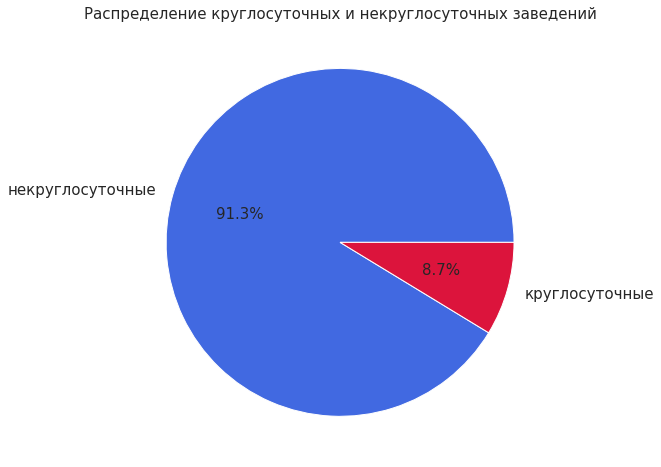

In [77]:
data['is_24_7'].value_counts().plot(
    kind='pie', figsize=(8, 8), ylabel=' ', fontsize=15,
    labels=['некруглосуточные', 'круглосуточные'],
    autopct='%1.1f%%',
    colors = ['#4169E1', '#DC143C'],
).axes.set_title('Распределение круглосуточных и некруглосуточных заведений', fontsize=15);

In [78]:
# посмотрим на распределение круглосуточных/некруглосуточных заведений по категориям
all_clock = data.groupby(['category', 'is_24_7'])['name'].count().reset_index()
all_clock.columns = ['category', 'is_24_7', 'count']
# all_clock

In [79]:
fig = px.bar(all_clock,
             x='category',
             y='count',
             text='count',
             color='is_24_7')

fig.update_layout(title='Количество круглосуточных/некруглосуточных заведений по категориям',
                   xaxis_title='Категория заведений',
                   yaxis_title='Количество заведений',
                   xaxis={'categoryorder':'total descending'},
                   plot_bgcolor='rgba(0,0,0,0)',
                  )
fig.show()
# color_continuous_scale = 'purp'

![](16.jpg)

In [80]:
# посмотрим на распределение круглосуточных/некруглосуточных заведений по округам
clock_district = (data.pivot_table(index='district', columns='is_24_7', values='name', aggfunc='count')
    .rename(columns={False: 'not_24_7', True: '24_7'})
    .sort_values(by='not_24_7', ascending = False)
    .reset_index()
)
clock_district.style.background_gradient(cmap='Blues')

is_24_7,district,not_24_7,24_7
0,Центральный административный округ,2111,131
1,Южный административный округ,816,74
2,Северо-Восточный административный округ,815,75
3,Северный административный округ,804,70
4,Западный административный округ,760,70
5,Восточный административный округ,694,97
6,Юго-Западный административный округ,633,73
7,Юго-Восточный административный округ,621,93
8,Северо-Западный административный округ,366,43


Значительное количество заведение в нашем датасете работает не в круглосуточном режиме - 91.3%  
Среди категорий заведений, самое большое количество предприятий, работающих круглосуточно - это кафе (266 точек), далее идут предприятия быстрого питания (150 точек) и рестораны (132 точки).  
Вероятнее всего поужинать ночью удастся в Центральном округе, там сосредоточено больше всего круглосуточных заведений - 131. Следом идут Восточный и Юго-Восточный административные округа (97 и 93 заведений соответственно). 

#### Заведения с 'плохим' рейтингом  
[Содержание](#content)  <a id="bad_rating"></a>

In [81]:
# напишем функцию для категорий рейтингов
def rating_group(row):
    rating = row['rating']
    if rating <= 3:
        return 'низкий рейтинг'
    elif rating < 4:
        return 'средний рейтинг'
    return 'высокий рейтинг'

In [82]:
# создадим новый столбец с категориями рейтингов
data['rating_type'] = data.apply(rating_group, axis=1)

In [83]:
# посмотрим на количество заведений по категориям рейтинга
fig = px.bar(data.groupby('rating_type')['name'].count().sort_values(ascending=False).reset_index(),
             x='name',
             y='rating_type',
             text='name',
             )
fig.update_layout(title='Количество заведений по категориям рейтинга',
                  xaxis_title='Количество заведений',
                  yaxis_title='',
                  yaxis={'categoryorder':'total ascending'},
                  width=900,
                  height=450,
                 plot_bgcolor='rgba(0,0,0,0)',
                 )
fig.update_traces(marker_color='#4169E1')
fig.show()

![](17.jpg)

In [84]:
# оставим в таблице заведения только с 'плохим' рейтингом
# под 'плохим' будем подразумевать рейтинг ниже 4 баллов
bad_rating = data.query('rating_type == "средний рейтинг" or rating_type == "низкий рейтинг"')
# bad_rating

In [85]:
# посмотрим на распределение заведений с 'плохим' рейтингом по категориям
fig = px.bar(bad_rating.groupby('category')['name'].count().reset_index(),
             x='name',
             y='category',
             text='name',
             )
fig.update_layout(title="Категории заведений с 'плохим' рейтингом",
                  xaxis_title='Количество заведений',
                  yaxis_title='',
                  yaxis={'categoryorder':'total ascending'},
                  width=900,
                  height=450,
                 plot_bgcolor='rgba(0,0,0,0)',
                 )
fig.update_traces(marker_color='#4169E1')
fig.show()

![](18.jpg)

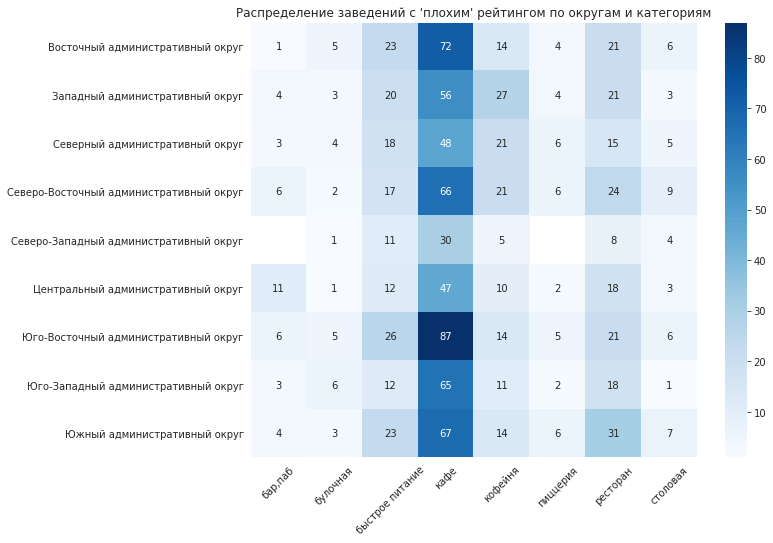

In [86]:
# посмотрим на распределение заведений с 'плохим' рейтингом по округам

plt.figure(figsize=(10,8))
sns.heatmap(bad_rating
            .pivot_table(index='district', columns = 'category', values='name', aggfunc='count'), 
            annot = True, 
            fmt='.0f', 
            cmap='Blues')
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.title("Распределение заведений с 'плохим' рейтингом по округам и категориям")
plt.xlabel('')
plt.ylabel('')
plt.show()

In [87]:
bad_rating_map = bad_rating.groupby('district')['name'].count().reset_index()

In [88]:
# построим фоновую картограмму для наглядного отображения количества заведений с 'плохим' рейтингом по округам

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=bad_rating_map,
    columns=['district', 'name'],
    key_on='feature.name',
    fill_color='PuBu',
    fill_opacity=0.8,
    legend_name='Количество заведений с плохим рейтингом по округам Москвы',
).add_to(m)

# выводим карту
m

![](19.jpg)

In [89]:
bad_rating_bill = bad_rating.groupby('district')['middle_avg_bill'].mean().reset_index()

In [90]:
# построим фоновую картограмму для наглядного отображения средней среднего чека заведений с 'плохим' рейтингом по округам

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=bad_rating_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='PuBu',
    fill_opacity=0.8,
    legend_name='Размер средней среднего чека заведений с плохим рейтингом по округам',
).add_to(m)

# выводим карту
m

![](20.jpg)

Преобладающее количество заведений в нашем датасете с высоким рейтингом (более 4 баллов) - 7185 предприятий общественного питания.  
На долю заведений со средним и низким рейтингом приходится 927 и 234 точки соответственно (далее 'плохой' рейтинг).  
Среди заведений с 'плохим' рейтингом больше всего представленно кафе - 538 предприятий. Далее, с большим отрывом, идут рестораны, с количеством заведений - 177 и предприятия быстрого питания - 162.  Меньше всего таких заведений среди пиццерий и булочных (35 и 30 соответственно).  
Согласно картам выше, большинство заведений с 'плохим' рейтингом сосредоточено в Юго-Восточном и Южном округах Москвы (~ 170 заведений в каждом округе). Самым 'светлым' участком по количеству заведений оказался Северо-Западный административный округ (59 заведений), но при этом, в данном округе самый высокий показатель средней среднего чека. Вероятно там расположены не самые популярные, но достатчно дорогие рестораны или иные заведения общепита.  С Южной частью Москвы примерно подобная обратная ситуация, расположено больше всего заведений среди округов, но средний чек в них один из самых низких. 


### Общий вывод
[Содержание](#content)  <a id="general_conclusion"></a>  

 1. Всего в нашем датасете представленно 8 категорий заведений. Больше всего в категориях кафе (2363 заведений), ресторан (2029 заведений) и кофейня (1401 заведений).  Эти же категории лидируют по количеству посадочных мест и чаще других являются сетевыми. Суммарно данные категории составляют почти 70% рынка общественного питания Москвы.  
 2. Меньше всего количество заведений и количество посадочных мест у категорий столовая и булочная.  
 3. На рынке общественного питания Москвы количество несетевых заведений значительно преобладает над количеством сетевых (61,9% против 38,1%). 
 4. В топ-15 самых популярных сетей Москвы вошли Шоколадница, Домино'с и Додо пицца, сеть кофеин Cofix, лавка братьев Короваевых и другие. Средний рейтинг у заведений из топ-15 - `4.2`.   
 5. Большинство заведений в нашем датасете - с высоким рейтингом (более 4 баллов) - 7185 предприятий. На долю заведений со средним и низким рейтингом приходится 927 и 234 точки соответственно. Большинство из них сосредоточено в Юго-Восточном и Южном округах Москвы (~ 170 заведений в каждом округе).  Средние рейтинги заведений общепита не сильно различаются в разных категориях предприятий. Наивысший средний рейтинг у баров и пабов - 4.4, пиццерии, рестораны и кофейни - 4.3 . Самая низкая оценка у предприятий быстрого питания - 4.0 .
 6. Самое большое количество заведений сосредоточено в ЦАО (2242 заведения), у них и самые высокие рейтинги среди округов Москвы. Так же в Центральном округе и самый высокий показатель медианы средних чеков заведений ( 1000 рублей) и чем дальше расположение от центра, тем меньше медиана среднего цека в заведении. Значительно меньшее количество предприятий расположено в Северо-Восточном, Южном и Северном административных округах (890, 890 и 874 заведений соответственно), меньше всего заведений представлено в Северо-Западном административном округ (409 заведений).  
 7. Кафе, рестораны и кофейни занимают лидирующие места по количеству заведений в каждом округе Москвы. Меньше всего представлено предприятий быстрого питания, столовых и булочных.  
 8. Лидером по количеству заведений стал Проспект мира (183 предприятия). Больше всего на ней расположено кафе, ресторанов и кофеин. Следом идут Профсоюзная улица и Ленинский проспект, на них расположено 122 и 107 заведения соответственно. На предпоследнем месте находится Пятницкая улица, единственная из топ-15, которая находится в самом центре Москвы (внутри садового кольца). Замыкает рейтинг улица Миклухо-Маклая с показателем в 47 заведений.  
 9. В нашем датасете представлено 457 улиц, на которых находится только один объект общепита. Больше всего таких улиц, и соответственно заведений расположено в ЦАО . Среди категорий заведений, с большим отрывом лидируют кафе (159 точек), далее идут рестораны и кофейни.  
 10. Значительное количество заведение в нашем датасете работает не в круглосуточном режиме - 91.3% . Среди категорий заведений, самое большое количество предприятий, работающих круглосуточно - это кафе (266 точек), далее идут предприятия быстрого питания (150 точек) и рестораны (132 точки).  В ЦАО сосредоточено больше всего круглосуточных заведений - 131. Следом идут Восточный и Юго-Восточный административные округа (97 и 93 заведений соответственно). 

## Шаг 4. Детализируем исследование: открытие кофейни:
[Содержание](#content)  <a id="open_cafe"></a>  

Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Попробуем определить, осуществима ли мечта клиентов.

### Количество кофеен, информация о районе расположения
[Содержание](#content)  <a id="count_cafe"></a>  

In [91]:
# отберем из нашего датасета кофейни
coffee_house = data[data['category'] == "кофейня"]
print('Всего в датасете представлено', coffee_house.shape[0], 'кофейни.')

Всего в датасете представлено 1401 кофейни.


In [92]:
# посмотрим на распределение кофеен по округам
fig = px.bar(coffee_house.groupby('district')['name'].count().reset_index(),
             x='name',
             y='district',
             text='name',
             )
fig.update_layout(title='Количество кофеен в каждом округе Москвы',
                  xaxis_title='Количество кофеен',
                  yaxis_title='',
                  yaxis={'categoryorder':'total ascending'},
                  width=900,
                  height=500,
                  plot_bgcolor='rgba(0,0,0,0)',
                 )
fig.update_traces(marker_color='#F08080')
fig.show()

![](21.jpg)

In [93]:
# построим фоновую картограмму для наглядного отображения количества кофеен по округам

moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)
    
coffee_house.apply(create_clusters, axis=1)

Choropleth(
    geo_data=state_geo,
    data=coffee_house.groupby('district')['name'].count().reset_index(),
    columns=['district', 'name'],
    key_on='feature.name',
    fill_color='OrRd',
    fill_opacity=0.8,
    legend_name='Количество кофеен по округам Москвы',
).add_to(m)

m

![](22.jpg)

Всего в нашем датасете представлены 1401 кофейни.  
Как и следовало ожидать, больше всего кофеен сосредоточено в Центральном округе - 428 заведений.  
Следом, с количеством 186 заведений, идет Северный округ.  
Меньше всего кофеен в Юго-Восточном и Северо-Западном округах (89 и 62 соотвествтенно).  
Изучив более детально карту Москвы (график выше), можно предположить следующие особенности раположения кофеен:  
- Центральная часть любого города всегда является самой посещаемой, как следствие, показатель количества заведений (в данном случае кофеен) самый высокий. 
- Помимо оживленных центральных улиц, кофейни расположены возле станций метро, в крупных торговых центрах, бизнес-центрах, в районе расположения крупных Жилых комплексов.  
- Малое количество кофеен в Северо-Западном округе объясняется наличием водных объектов Москвы-реки, большого количества парков, занимающих большую площадь данного района.

### Топ-10 улиц по количеству кофеен
[Содержание](#content)  <a id="top_coffee"></a>

In [94]:
# сначала найдем топ-15 улиц по количеству кофеен
coffee_top_street = (
    coffee_house.groupby('street')[['name']]
    .count()
    .rename(columns={'name': 'count'})
    .sort_values(by='count', ascending=False)
    .reset_index()
    .head(10)
)
coffee_top_street

,street,count
0,проспект мира,36
1,ленинский проспект,23
2,ленинградский проспект,18
3,профсоюзная улица,18
4,каширское шоссе,16
5,проспект вернадского,14
6,варшавское шоссе,14
7,новослободская улица,13
8,кутузовский проспект,13
9,ленинградское шоссе,13


In [95]:
fig = px.bar(coffee_top_street,
             x='count',
             y='street',
             text='count',
             )
fig.update_layout(title='Топ-10 улиц с самым большим количеством кофеен',
                  xaxis_title='Количество заведений',
                  yaxis_title='',
                  yaxis={'categoryorder':'total ascending'},
                  width=900,
                  height=600,
                 plot_bgcolor='rgba(0,0,0,0)',
                 )
fig.update_traces(marker_color='#F08080')
fig.show()

![](23.jpg)

- Как и с количеством заведений в целом, с достаточно большим отрывом, лидером среди топ-10 улиц Москвы по количеству кофеен оказался Проспект мира (36 кофеен). Это также объясняется протяженностью улицы, большим количеством достопримечательностей, наличием парковых зон и зон отдыха. 
- Следом идет Ленинский проспект (23 кофейни). Кофейни расположены в непосредственной близости к Нескучному саду и к Парку культуры и отдыха, в районе расположения крупных торговых центров и бизнес-центров.
- Третье место делят Ленинградский проспект и Профсоюзная улица с показателем 18 кофеен.  Много кофеен расположено возле станций метро, в крупных ЖК, а так же у парков и культурных объектов.
- Замыкают рейтинг сразу три улицы Ленинградское шоссе, Кутузовский проспект и Новослободская улица с равным количеством кофеен - 13. На Новослободской улице кофейни расположены достаточно равномерно, некоторое количество возле крупных станций метро, остальные на протяжении всей улицы. На Ленинградском шоссе и Кутузовском проспекте основное скопление кофеен в крупных торговых центрах (Океания и Метрополис).

### Время работы кофеен.  Соотношение сетевых и несетевых заведений
[Содержание](#content)  <a id="opening_hours"></a>  

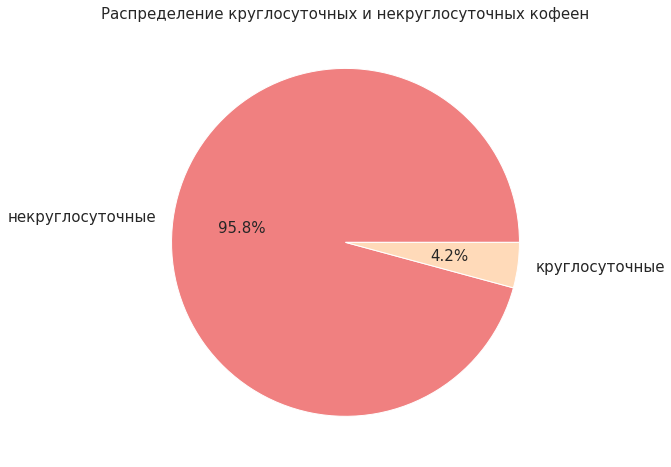

In [96]:
# посмотрим есть ли круглосуточные кофейни
coffee_house['is_24_7'].value_counts().plot(
    kind='pie', figsize=(8, 8), ylabel=' ', fontsize=15,
    labels=['некруглосуточные', 'круглосуточные'],
    autopct='%1.1f%%',
    colors = ['#F08080', '#FFDAB9'],
).axes.set_title('Распределение круглосуточных и некруглосуточных кофеен', fontsize=15);

In [97]:
# посмотрем на распределение на сетевые и несетевые кофейни
fig = go.Figure(data=[go.Pie(labels=['сетевые', 'несетевые'], 
                             values=coffee_house['chain'].value_counts(),
                             pull=[0.05])])
fig.update_traces(marker=dict(colors=['#F08080', '#FFDAB9']))
fig.update_layout(title_text='Распределение сетевых и несетевых кофеен')
fig.show()

![](24.jpg)

- Как мы видим, практически все кофейни работают не в круглосуточном режиме. Это стандартный и распрострененный режим работы, т.к. в большей степени спрос на кофе и напитки в утренние/обеденные часы и в выходные. Открывать круглосуточную кофейню не столь целесообразно, это включает дополнительные траты на персонал, оплату коммунальных платежей и тд. И вероятно, ночью желающих попить кофе не такое большое количество, многие предпочтут рестораны или бары.  
- Доли сетевых и несетевых кофеен приблизительно равны, это говорит о том, что и для несетевой кофейни есть все шансы развиваться, стать успешной и закрепиться на рынке.

### Распределение рейтингов кофеен по округам Москвы
[Содержание](#content)  <a id="district_rating"></a>  

In [98]:
# расчитаем средний рейтинг кофеен по округам
coffee_rating = (
    coffee_house.groupby('district', as_index=False)['rating']
    .agg('mean')
    .round(2)
    .sort_values(by='rating', ascending=False)
    )
coffee_rating

,district,rating
5,Центральный административный округ,4.34
4,Северо-Западный административный округ,4.33
2,Северный административный округ,4.29
0,Восточный административный округ,4.28
7,Юго-Западный административный округ,4.28
6,Юго-Восточный административный округ,4.23
8,Южный административный округ,4.23
3,Северо-Восточный административный округ,4.22
1,Западный административный округ,4.19


In [99]:
# выведем на карту Москвы распределение средних рейтингов по округам

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffee_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='Oranges',
    fill_opacity=0.8,
    legend_name='Средний рейтинг кофеен по округам Москвы',
).add_to(m)

# выводим карту
m

![](25.jpg)

In [100]:
# round(coffee_house['rating'].mean(), 2)

- Средний рейтинг всех кофеен Москвы составляет 4.28 балла.  
- По округам, средние рейтинги кофеен не сильно различаются и находятся в диапазоне 4.19 - 4.34 балла.  
- В Центральном округе самый высокий средний рейтинг - 4.34, но там и расположенно больше всего кофеен.  Следом идет Северо-Западный округ с показателем 4.33, интересно, что по количество кофеен данный округ занимает последнее место, что говорит о том, что хоть количество заведений невелико, они следят за своей репутацией, сервисом и посетители довольны. 
- На третьем месте Северный округ с показателем 4.29. И далее средний рейтинг кофеен по округам снижается.

### Стоимость чашки капучино
[Содержание](#content)  <a id="cappuccino_price"></a>  

In [101]:
cappuccino_please = (
    coffee_house.groupby('district', as_index=False)['middle_coffee_cup']
    .agg('mean')
    .round(1)
    .sort_values(by='middle_coffee_cup', ascending=False)
    )
#cappuccino_please

In [102]:
# посмотрим на среднюю стоимость чашки капучино по округам
fig = px.bar(cappuccino_please,
             x='middle_coffee_cup',
             y='district',
             text='middle_coffee_cup',
             )
fig.update_layout(title='Средняя стоимость чашки капучино по округам Москвы',
                  xaxis_title='Средняя стоимость чашки капучино',
                  yaxis_title='',
                  yaxis={'categoryorder':'total ascending'},
                  width=900,
                  height=500,
                  plot_bgcolor='rgba(0,0,0,0)',
                 )
fig.update_traces(marker_color='#F08080')
fig.show()

![](26.jpg)

In [103]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=cappuccino_please,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='Reds',
    fill_opacity=0.8,
    legend_name='Средняя стоимость чашки капучино по округам Москвы',
).add_to(m)

# выводим карту
m

![](27.jpg)

In [104]:
# round(coffee_house['middle_coffee_cup'].mean(), 0)

- Средняя стоимость чашки капучино в Москве составляет 173 рубля.  
- Среди округов Москвы средняя стоимость капучино находится в диапазоне - 143 - 189 рублей.
- Так дороже всего чашка капучино обойдется в Западном и Центральном округах ~ 188 рублей. 
- Более приемлемую цену за капучино просят в Северном и Северо-Западном округах ~ 166 рублей.
- Самая низная цена чашки капучино представлена в Восточном округе ~ 143 рубля.

**Вывод**  


- Всего в нашем датасете представлены 1401 кофейни.  
- Помимо оживленных центральных улиц, кофейни расположены возле станций метро, железнодорожных станций, в крупных торговых центрах, бизнес-центрах, в районе расположения крупных жилых комплексов.  
- Практически все кофейни работают не в круглосуточном режиме.  
- Доли сетевых и несетевых кофеен приблизительно равны, что говорит о возможности для частных предпринимателей, при грамотно спланированном бизнес-плане, осуществить свою мечту по открытию кофейни.  
- Лидирует по количеству кофеен Проспект мира - 36 заведений. Далее идут Ленинский проспект (23 кофейни) и Профсоюзная улица с Ленинградским проспектом (18 кофеен). 
- В Центральном округе сосредоточено больше всего кофеен - 428 заведений. Этот округ лидирует и по самому высокому среднему рейтингу кофеен - 4.34, и по самой высокой средней стоимости чашки капучино ~ 188 рублей. 
- Далее по количеству заведений идет Северный округ - 186 кофеен. Данный округ демонстрирует неплохой показатель среднего рейтинга 4.29 балла и показатель стоимости чашки капучино близкий к средней цене по Москве ~ 166 рублей.  
- Меньше всего кофеен расположено в Северо-Западном округе - 62 заведения, но они показывает один из лучших результатов по среднему рейтингу - 4.33 балла. Вероятно это можно объяснить большим количеством парковых зон и набережных, нагулявшись по которым, посетители заглядывают на чашечку кофе и остаются довольными не только от посещения заведения, но и от времяпровождения в целом и охотнее оставляют положительные отзывы. 
- Западный округ показывает самый низкий средний рейтинг - 4.19 балла и высокую среднюю стоимость за чашку капучино ~ 188 рублей.  
- Самая низная цена чашки капучино представлена в Восточном округе ~ 143 рубля.


### Рекомендации для открытия нового заведения
[Содержание](#content)  <a id="recommendations"></a>  

Проанализировав данные с заведениями общественного питания Москвы, составленные на основе данных сервисов Яндекс.Карты и Яндекс.Бизнес на лето 2022 года, можно дать следующие рекомендации:
- Открытие кофейни отличная идея, так как кофейни одна из самых популярных категорий заведений на рынке Москвы, наряду с ресторанами и кафе, но в отличие от последних, рынок еще не перенасыщен данными заведениями, что дает отличную возможность занять кофейную нишу.  
Также, при анализе самых популярных сетей Москвы, в топ-15 попало 6 кофеен, что говорит о их востребованности и популярности.
- Так как концепция подразумевает открытие "такой же крутой и доступной, как «Central Perk», кофейни в Москве", по району размещения, мы рекомендуем присмотреться к Северному административному округу:  
 1. Он занимает второе место по количеству кофеен после Центральной части Москвы, что говорит о популярности заведений в округе. При этом рынок кофеен не перенасыщен как в центре столицы.  
 2. Также занимает второе место по самому высокому среднему рейтингу как всех категорий заведений, так и кофеен в частности. С одной стороны это говорит о лояльности посетителей, а с другой - необходимости "держать марку" и соответствовать требованиям рынка.  
 3. В Северном округе расположена 51 улица, на которой находится только один объект общественного питания, что дает отличную возможность подобрать удачное расположение для открытия новой кофейни без конкурентов поблизости.  
 4. Размер медианы среднего чека в заведениях Северного округа находится на уровне 650 рублей. А средняя стоимость чашки капучино равна 166 рублей. Выбирая ценовую политику для кофейни, стоит придерживаться этих показателей, чтобы сохранить конкурентоспособность и не выбиваться из рынка. 
- Что касается формата бизнеса, доли сетевых и несетевых кофеен приблизительно равны, это говорит о возможности для частных предпринимателей, при грамотно спланированном бизнес-плане, осуществить свою мечту по открытию кофейни.
- Нет необходимости открывать круглосуточную кофейню, хоть их количество в Москве совсем невелико, это будет сопровождаться дополнительными тратами на персонал и обслуживание заведения. Возможно, по истечении времени, после открытия, можно будет провести опрос у посетителей, изучить их отзывы и определиться с продлением графика работы заведения.  


Для проведения более детального анализа необходимо изучить информацию о целевой аудитории, проходимости, стоимости арендной платы помещений и оборудования (при необходимости),  затраты на рекламу и др.

## Ссылка на презентацию
[Содержание](#content)  <a id="presentation"></a>  

https://disk.yandex.ru/d/MlSEUTi9TJ8jVA